# SD Traffic Analysis

Traffic is an issue that is part of everyone's everyday life. As UCSD students who lives commute to UC San Deigo every day, it is even more important for us to understand the traffic regulation within San Diego area. So we decided to analyze the traffic collision dataset maintained by city of San Diego police department. Since the dataset include variaties of dimentions, it allow us to make inferrences and build correlations among each others. We are hopeful that data sets like this one can be used to create safer and more efficient communities for everyone.

#Overview

Within this project, we explore patterns of San Diego traffic collisions based on location, time, weather, and severity, and try to predict the number and the severity of accidents based on time and violation types. We are analyzing traffic collision data collected by the San Diego Police department, and we specifically focus on data from 2018 January to 2022 January. We are able to find out specific times and locations that are associated with highest severity. We are able to find the correlation between weather and severity.We also tried to create a model to predict the pattern of collision severity based on time. 


# Background & prior work


The use of vehicles become human being’s indispensable part of modern society. Although driving provides people with many conveniences, we can not overlook the large number of car accidents that happened every day and everywhere. In the US, there are 6 million car accidents every year and more than 90 people die in car accidents every day[1]. As students study and live in San Diego, we want to know if there is way to predict the time and locations of car accidents happend in San Diego[2].Our project aims to find out whether car accidents in San Diego are specifically linked to time and location, and the impact of the types of accidents that occur in different time and locations. Then, we want to produce an predictive analysis to demonstrate when and where are most likely to occur car accidents in San Diego. Our prior work already access to the car accidents datasets published by the govenment of San Diego, and read other similar study and analysis in NewYork and Los Angeles.

1.Car Accident Statistics in the U.S. (2021, March 17). DriverKnowledge. https://www.driverknowledge.com/car-accident-statistics/

2.Deep learning helps predict traffic crashes before they happen. (2021, October 12). MIT News | Massachusetts Institute of Technology. https://news.mit.edu/2021/deep-learning-helps-predict-traffic-crashes-1012

# Names

- Jiayang Bao
- Yuxuan Chen
- Jingtian Ma
- Tianze Zhang
- Xinyi(Cindy) Wang

# Research Question

1. How are San Deigo car collisions distributed geographically and what are some areas and intersections that have very high collision rates? 
2. How do San Deigo traffic collsions vary by years, time of the day, day of the week, and month of the year in terms of severity?
3. Is there any correlation between temperature，the quantity of rainfall, and the severity of traffic collisions?

In additional to these two research questions, we also hope to build a model to predict the pattern of the San Deigo traffic collisions.




# Hypothesis

We hypothesize that day time (such as 8am and 5pm ) during week days and urban areas are most likely to occur car accidents. Since 8am and 5pm are the time people go to work and go home, there are more cars on the street and the possibility of accidents thus increases. Also, because urban areas usually have more car and crowded, the chance of accidents is higher than other areas. We hypothesize that there should not be any different between years since the number of people in San Deigo has not changed dramatically. We also hypothesize there is correlation between precipitation and severity. Since rainny day may cause road be slippery which causing more injures and death. We hypothesize there is no correlation between temperature and severity. 

# Dataset(s)

1.Dataset Name: traffic collision data of San Diego

Link to the dataset: https://data.sandiego.gov/datasets/police-collisions/

Number of observations: 37145

Description: It's the data of date/time, types and locations of collision accidents in Sna Deigo within 2017-2022.


2.Dataset Name: Geocoded_pd_collsions_dataset

Link to the dataset:https://data.sandiego.gov/datasets/police-collisions/

Number of observations:27570

Description: Including latitude and longitude from 2017-2019 we gonna use to plot interactive map.

3.Dataset Name: San Diego Weather-GHCN Daily

Link to the dataset: https://oceaninformatics.ucsd.edu/datazoo/catalogs/ccelter/datasets/13/datatables/13

Number of observations:29343

Description: Including temperature and precipitation data from 1939-2019.


# Setup

Before we actually process the data, we need to important all libraries, packages, and models that we will utilize. 

In [4]:

%pip install geopandas
%pip install descartes
#%pip install osmnx
%pip install folium
%pip install mapclassify
# import pandas & numpy library
import pandas as pd
import numpy as np

# Import seaborn and apply its plotting styles
import seaborn as sns
sns.set(font_scale=2, style="white")

# import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style

# Statmodels & patsy
import patsy
import statsmodels.api as sm

from wordcloud import WordCloud

import math

import geopandas as gpd
from geopandas import GeoDataFrame

from shapely.geometry import Point
import folium

from folium.plugins import MarkerCluster
import mapclassify
import warnings
warnings.filterwarnings("ignore")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Then we import our raw dataset. The data begins in January 2015 and is updated daily. Each row corresponds to a collision. Since this data is downloaded from San Diego police department, it’s very unlikely that there are errors. Below is a visualizations of some of the key fields:

In [5]:
# read in data from csv
df = pd.read_csv('pd_collisions_datasd_v1.csv')
#show unclean data
df.head()

,report_id,date_time,police_beat,address_no_primary,address_pd_primary,address_road_primary,address_sfx_primary,address_pd_intersecting,address_name_intersecting,address_sfx_intersecting,violation_section,violation_type,charge_desc,injured,killed,hit_run_lvl
0,600096,2015-01-01 15:19:00,112,3600,,MT EVEREST,BOULEVARD,,,,22107,VC,TURNING MOVEMENTS AND REQUIRED SIGNALS,0,0,NaN
1,600068,2015-01-02 13:04:00,437,2800,S,WOODMAN,STREET,,,,21801A,VC,LEFT TURN YIELD UNTIL SAFE OR U-TURN,1,0,MISDEMEANOR
2,503178,2015-01-02 18:21:00,824,4900,,COLLWOOD,BOULEVARD,,,,22350,VC,"VIOLATION OF BASIC SPEED LAW, SPEED UNSAFE FOR...",3,0,NaN
3,600051,2015-01-02 20:15:00,833,3800,,MENLO,AVENUE,,,,22107,VC,TURNING MOVEMENTS AND REQUIRED SIGNALS,0,0,MISDEMEANOR
4,503396,2015-01-13 13:51:00,724,2200,,PALM,AVENUE,,,,21950A,VC,YIELD RIGHT OF WAY TO PEDESTRIANS,1,0,NaN


# Data Cleaning


As with any data set, this one needs cleaning before starting any analysis. There are a few columns with only one value, reflecting the fact that all rows in this data correspond to traffic collisions.
We start by separating one column into several different columns with each informatino separated to make our analyzation easier. 


In [6]:
#delete report_id police_beat address_no_primary address_pd_primary address_pd_intersecting 
# address_name_intersecting address_sfx_intersecting violation_section hit_run_1v1
df=df.drop(columns=['report_id','police_beat','address_no_primary','address_pd_primary','address_pd_intersecting','address_name_intersecting','address_sfx_intersecting','charge_desc','hit_run_lvl'])

# get only year-month-day and store to the date
df['date'] = df['date_time'].str[0:10]

#add new date_in_month column to store the month
df["date_in_month"]=df["date_time"].str[5:7]
df["date_in_month"]=df["date_in_month"].astype(int)

#add new date_in_month column to store the hour of the day
df["date_in_hour"]=df["date_time"].str[10:13]
df["date_in_hour"]=df["date_in_hour"].astype(int)

#add up injured+killed*3 new column named severity
#killed has higher weights in severity than injured so we times 3 in killed number
df["Severity"]=df["injured"]+df["killed"]*3
df=df.drop(columns=['injured','killed'])

# copy the dataframe for later weather anlysis
df_copy = df


We decided to use datapoints from 2018 to 2021 because we want to focuses more on recent years which are more applicable. 

In [7]:
# only keep data that has date_time range from 2018 to 2021
list = ["2015","2016","2017","2022"]
for i in list:
    df = df[df["date_time"].str.contains(i) == False]

The next step is to check for null or missing values. We find out that there is one row in address_road_primary that has null datapoint. Since outdatasets contains huge amount of data, we decided to drop the whole row. 

In [8]:
# check for null, we find out address_road_primary has one row of null, we choose to delete it
print('violation_section:',df['violation_section'].hasnans)
print('Severity:',df['Severity'].hasnans)
print('date_in_month:',df['date_in_month'].hasnans)
print('date_in_hour:',df['date_in_hour'].hasnans)
print('date_time:',df['date_time'].hasnans)
print('address_road_primary:',df['address_road_primary'].hasnans)
df[df['address_road_primary'].isnull()]
df=df.dropna(subset=['address_road_primary'])
print('address_road_primary:',df['address_road_primary'].hasnans)

violation_section: False
Severity: False
date_in_month: False
date_in_hour: False
date_time: False
address_road_primary: True
address_road_primary: False


Then we try to get a sense about how out dataset looks like:

In [9]:
df.shape

(37144, 9)

We have in total 37149 data which corresponding to 37149 traffic collisions.

In [10]:
#show clean data
df.head()

,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity
28684,2018-01-01 00:30:00,EL CAMINO DE TEATRO,,22350,VC,2018-01-01,1,0,0
28685,2018-01-01 01:00:00,ROSECRANS,STREET,22350,VC,2018-01-01,1,1,0
28686,2018-01-01 01:26:00,PALM,AVENUE,21954A,VC,2018-01-01,1,1,3
28687,2018-01-01 02:05:00,LOGAN,AVENUE,22450(A),VC,2018-01-01,1,2,0
28688,2018-01-01 02:26:00,DIVISION,STREET,22107,VC,2018-01-01,1,2,0


In [11]:
df.describe()

,date_in_month,date_in_hour,Severity
count,37144.000000,37144.000000,37144.000000
mean,6.599612,12.933933,0.591616
std,3.432596,6.456225,1.044989
min,1.000000,0.000000,0.000000
25%,4.000000,9.000000,0.000000
50%,7.000000,14.000000,0.000000
75%,10.000000,18.000000,1.000000
max,12.000000,23.000000,122.000000


Since we want to anlysis the correlation between severity and weather later on. We may want to do some data cleaning in our weather dataset.

In [12]:
weather_df = pd.read_csv('San Diego Weather - GHCN Daily.csv')
print('shape:',weather_df.shape)
weather_df.head()

shape: (29343, 18)


,Date,Min Temp (C),Min Temp M Flag,Min Temp Q Flag,Min Temp S Flag,Max Temp (C),Max Temp M Flag,Max Temp Q Flag,Max Temp S Flag,Avg Temp (C),Precipitation (mm),Precipitation M Flag,Precipitation Q Flag,Precipitation S Flag,Average Wind Speed (m/s),Average Wind Speed M Flag,Average Wind Speed Q Flag,Average Wind Speed S Flag
0,1939-07-01,17.2,NaN,NaN,0,24.4,NaN,NaN,0,20.80,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN
1,1939-07-02,18.3,NaN,NaN,0,23.3,NaN,NaN,0,20.80,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN
2,1939-07-03,16.7,NaN,NaN,0,21.7,NaN,NaN,0,19.20,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN
3,1939-07-04,17.2,NaN,NaN,0,21.7,NaN,NaN,0,19.45,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN
4,1939-07-05,17.8,NaN,NaN,0,22.2,NaN,NaN,0,20.00,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN


By taking look at the weather data, we find out the all we need is the average temperature and precipitation colums. So we only keep this two columns. We then check if there is any values in precipitationa andn average temp that may be unusual. And we find there are several numbers are negative. So we choose to drop them.

In [13]:
# keep only date, precipitation and temperature in weather dataset
weather_df = weather_df[['Date','Precipitation (mm)','Avg Temp (C)']]
# find the rows which are not worth to investigate
print(weather_df.loc[weather_df['Precipitation (mm)']<0])
pos = [2836,2837,2838,29341,29342]
#drop the rows that we didn't need to investigate
weather_df.drop(weather_df.index[pos], inplace=True)

             Date  Precipitation (mm)  Avg Temp (C)
2836   1947-04-06              -999.9        -999.9
2837   1947-04-07              -999.9        -999.9
2838   1947-04-08              -999.9        -999.9
29341  2019-10-30              -999.9        -999.9
29342  2019-10-31              -999.9        -999.9


In [14]:
j = 1939
some = []
while j < 2015:
  some.append(str(j))
  j= j+1
for i in some:
    weather_df = weather_df[weather_df["Date"].str.contains(i) == False]
weather_df.reset_index(inplace = True, drop = True)
weather_df

,Date,Precipitation (mm),Avg Temp (C)
0,2015-01-01,0.0,10.00
1,2015-01-02,0.0,10.30
2,2015-01-03,0.0,11.95
3,2015-01-04,0.0,13.05
4,2015-01-05,0.0,16.65
...,...,...,...
1758,2019-10-25,0.0,23.90
1759,2019-10-26,0.0,20.80
1760,2019-10-27,0.0,18.35
1761,2019-10-28,0.0,18.35


# Data Analysis and Results

## Analyze Collisions by Geography

First of all, since the data has multiple fields describing where a collision occurred. we decided to start out by looking at these fields. First, I’ll plot the distribution of collisions by area. As you can see from below, there are about 3978 streets in total. Instead of looking at the ditribution of all streets, we decided to look at the distribution for top 20 streets that has greater amount of collisions.

In [15]:
streets = df['address_road_primary'].unique()
print(streets)
print(len(streets))

['EL CAMINO DE TEATRO' 'ROSECRANS' 'PALM' ... 'WORTHING' 'THRONE'
 'OF CURBLINE 1900 CYPRESS']
3976


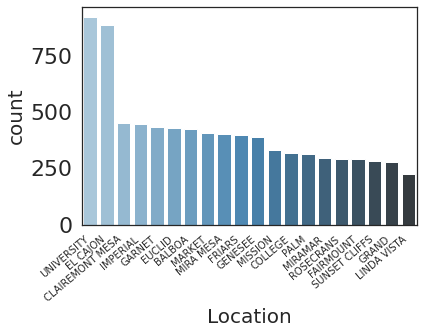

In [16]:
top_20 = pd.DataFrame(df['address_road_primary'].value_counts()).reset_index().head(20)
plot1 = sns.barplot(data=top_20, x='index', y='address_road_primary', palette='Blues_d')
plot1.set_xticklabels(plot1.get_xticklabels(), rotation=40, ha="right" ,fontsize=10)
plot1.set_xlabel("Location", fontsize = 20)
plot1.set_ylabel("count", fontsize = 20)

top_20['address_road_primary'].describe()
top20 = df['address_road_primary'].groupby(df['Severity'])
top20

UNIVERSITY         920
EL CAJON           887
CLAIREMONT MESA    450
IMPERIAL           448
GARNET             432
                  ... 
COSOY                2
MT ARARAT            2
I-805                2
SANYO                2
BISHOPS              2
Name: address_road_primary, Length: 1763, dtype: int64


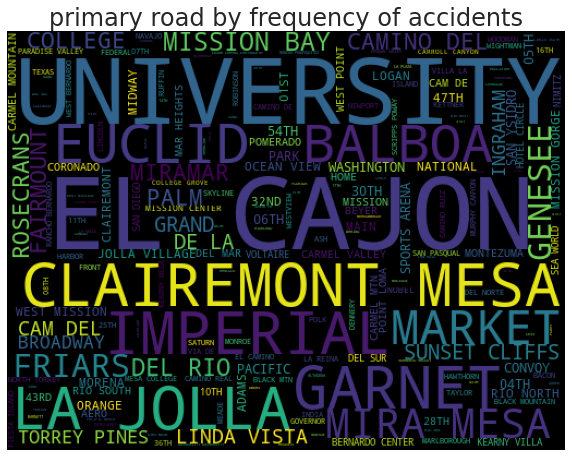

In [17]:
data = df.groupby('address_road_primary').filter(lambda x: len(x) > 1)
print(data['address_road_primary'].value_counts())
plt.subplots(figsize=(10, 10))
some = data['address_road_primary']
plt.title('primary road by frequency of accidents')
wordcloud = WordCloud(background_color="black", width=512, height=384).generate(" ".join(some))
plt.axis("off")
plt.imshow(wordcloud)

Now we want to see the traffic collision showing on the map. So we decide to input another dataset which has longitude and latitute columns. This dataset has all the traffic collision happened from 2017-2019. And it is from the same website of previous dataset. The unique ID shows that their accidents are overlap. So there is no problem to use this dataset.

In [18]:
df2 = pd.read_csv('geocoded_pd_collisions_dataset.csv')
print('shape',df2.shape)
df2.head()

shape (27570, 27)


,report_id,date_time,police_beat,address_number_primary,address_pd_primary,address_road_primary,address_sfx_primary,address_pd_intersecting,address_name_intersecting,address_sfx_intersecting,...,accident_month,hour,time,day_of_week_name,full_address,latitude,longitude,location,point,altitude
0,170082,2017-01-01 00:01:00,935,5500,NaN,VALERIO,TRAIL,NaN,NaN,NaN,...,1,0,00:01:00,SAT,"5500 VALERIO TRAIL, SAN DIEGO, CALIFORNIA, USA",32.962330,-117.201447,"5500, Valerio Trail, Pacific Highlands Ranch, ...","(32.96233, -117.201447, 0.0)",0.0
1,170166,2017-01-01 00:01:00,124,8300,NaN,CAM DEL ORO,NaN,NaN,NaN,NaN,...,1,0,00:01:00,SAT,"8300 CAM DEL ORO , SAN DIEGO, CALIFORNIA, USA",NaN,NaN,NaN,NaN,NaN
2,170101,2017-01-01 00:01:00,322,6400,NaN,CRAWFORD,STREET,NaN,NaN,NaN,...,1,0,00:01:00,SAT,"6400 CRAWFORD STREET, SAN DIEGO, CALIFORNIA, USA",32.789919,-117.093968,"6400, Crawford Street, Grantville, San Diego, ...","(32.789919, -117.093968, 0.0)",0.0
3,170218,2017-01-01 00:01:00,325,8100,NaN,ROYAL GORGE,DRIVE,NaN,NaN,NaN,...,1,0,00:01:00,SAT,"8100 ROYAL GORGE DRIVE, SAN DIEGO, CALIFORNIA...",32.814888,-117.051316,"8100, Royal Gorge Drive, Navajo, San Diego, Sa...","(32.814888, -117.051316, 0.0)",0.0
4,170220,2017-01-01 01:00:00,524,1000,NaN,A,STREET,NaN,NaN,NaN,...,1,1,01:00:00,SAT,"1000 A STREET, SAN DIEGO, CALIFORNIA, USA",33.043641,-116.870011,"1000, A Street, Ramona, San Diego County, Cali...","(33.043641, -116.870011, 0.0)",0.0


As you can see there are lots of columns that are useless for our anlysis. The only three things we need is data time, longitude and latitude.

In [19]:
# drop any null value in longitude and latitude column
df2 = df2.dropna(how = 'any',subset = ['latitude','longitude'])
# select the san diego as our fcous in folium map.
point_map = folium.Map(location = [32.7157,-117.1611],zoom_start = 11, width = 1000, height = 600,control_scale = True)
marker_cluster = MarkerCluster().add_to(point_map)
for index, row in df2.iterrows():
    folium.Marker([row['latitude'],row['longitude']]).add_to(marker_cluster)
point_map

### University Ave and El Cajon Blvd

As we can see from the previous visulizations, There are 6431 traffic accidents from 2017-2019 happened arround downtown of San Diego. By further investigate, both University avenue and El Cajon blvd have very high collision rates. In fact, according to San Deigo local news Fox5, University avenue is the most dangerous street in San Diego since there is no crosswalk and lights in a lot of the areas, and according to San Deigo Union Tribone, El Cajon blvd is also not padestrian friendly. By looking at the map, these two streets are actaully located parallel and near to each other. To make sure that there is misleading value, we need to look into those two streets by plotting the overall distribution traffic collisions over time. 

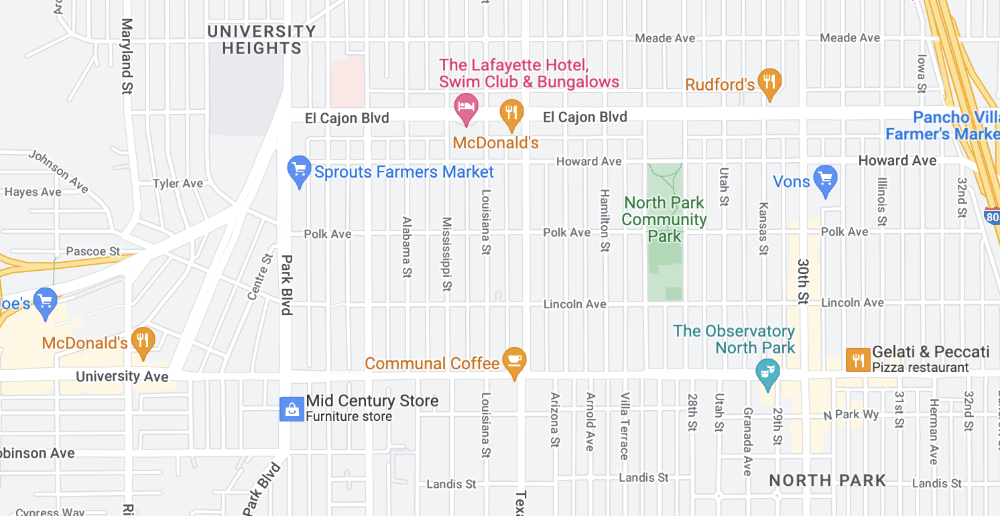

(1.0, 6.0)

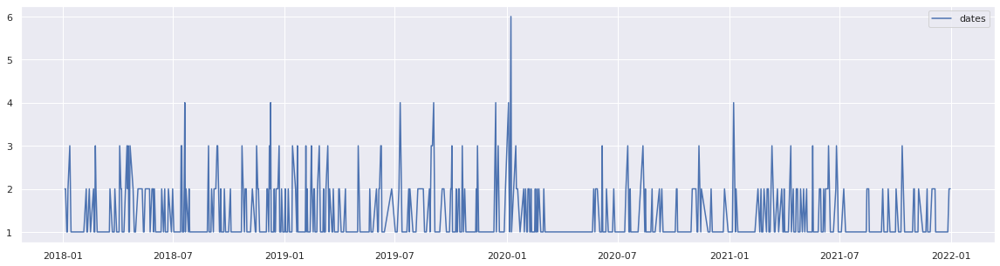

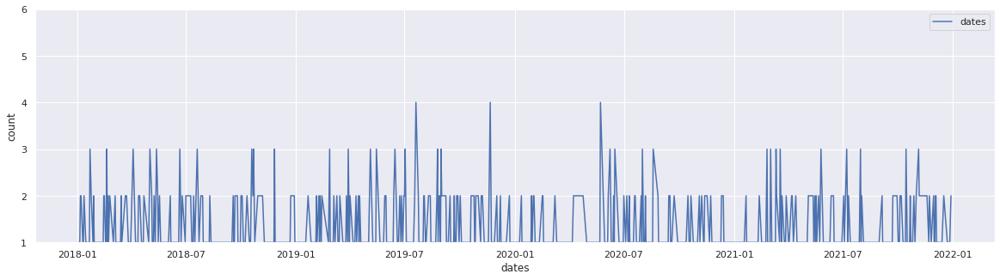

In [20]:
# create a data frame that only contains university avenue 
df_sub1 = df[(df['address_road_primary'] == 'UNIVERSITY')]
time_info = pd.to_datetime(df_sub1['date_time'], format='%Y-%m-%d %H:%M:%S')

# add 3 new columns to the dataFrame
df_sub1['dates'] = pd.DatetimeIndex(time_info).date

sns.set(rc = {'figure.figsize':(20,5)})
map = df_sub1['dates'].value_counts().to_frame()
map.plot(label='dates')

# create a data frame that only contains EL CAJON avenue 
EL = df[df['address_road_primary'] == 'EL CAJON']
time_info2 = pd.to_datetime(EL['date_time'], format='%Y-%m-%d %H:%M:%S')

EL['dates'] = pd.DatetimeIndex(time_info2).date

sns.set(rc = {'figure.figsize':(20,5)})
map2 = EL['dates'].value_counts().to_frame()
map2.plot(label='dates')

plt.xlabel("dates")
plt.ylabel("count")
plt.ylim(1, 6)

The trend for both graph are similar but the overall, the amount of collisions for university avenue is greater than El Cajon street. Also there is a gap for university avenue between 2020-01 to 2020-07 for which means that there are no traffic collisions in this period, . This is unusual, we may need to look into these data and figure out why.

In [21]:
df_sub2 = df_sub1[df_sub1['date_time'].str.contains(r'2020', regex=True)]
df_sub2.head()

,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity,dates
48856,2020-01-04 08:10:00,UNIVERSITY,AVENUE,21453A,VC,2020-01-04,1,8,2,2020-01-04
48857,2020-01-04 08:45:00,UNIVERSITY,AVENUE,23152A,VC,2020-01-04,1,8,2,2020-01-04
48870,2020-01-04 14:45:18,UNIVERSITY,AVENUE,22350,VC,2020-01-04,1,14,1,2020-01-04
48881,2020-01-04 22:00:00,UNIVERSITY,AVENUE,22107,VC,2020-01-04,1,22,0,2020-01-04
48889,2020-01-05 03:00:56,UNIVERSITY,AVENUE,23152A,VC,2020-01-05,1,3,0,2020-01-05


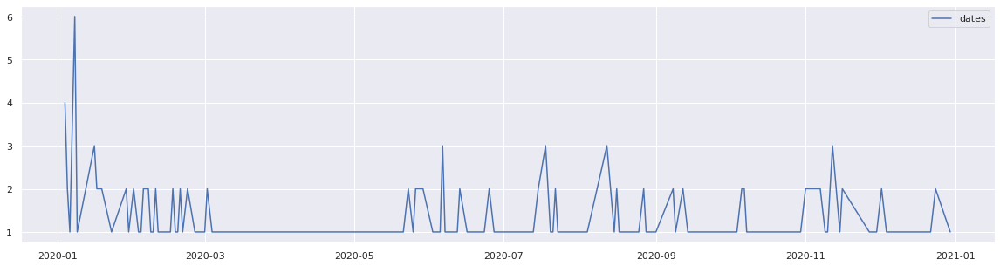

In [22]:
sns.set(rc = {'figure.figsize':(20,5)})
map = df_sub2['dates'].value_counts().to_frame()
map.plot(label='dates')

We extract 2020's collision's data from the original dataframe iplot a line plot again, and we found out that the gap is from 2020-03 to 2020-06, after researching online, we still could not find any information about the street closure, so we assume that the street is open to public. Thus, the number of collision between 2020-03 and 2020-06 is 0. This outcome is possible given that this time of year is the worst time of the epidemic in the United States and everyone is staying home to prevent the spread of the disease. Similarly, the number of collision for El Cajon blvd is very low during this time. We confirm that collision pattern for both streets are normal. 

As a result, the number of collisions for Univerity avenue and El Cajon blvd are significantly higher than the rest of streets, which varies by smaller differences. We may want to predict the collision pattern separetly for these 2 streets. 

## Analyze with severity

We have already look at the relationship between car collision and date. However, not every car collsion has the same severity. Some car collisions are more severe, with more injuried and killed people, while some are less severe with no one injuried or killed. As a result, it's important to take severity into account. Previously in the data cleaning part we have already calculated the severity based on injuried and killed number. Now we want to see if the car collisions with high severity have tendency to appear in particular time.

Text(0, 0.5, 'number of times happened with high severe car collisions')

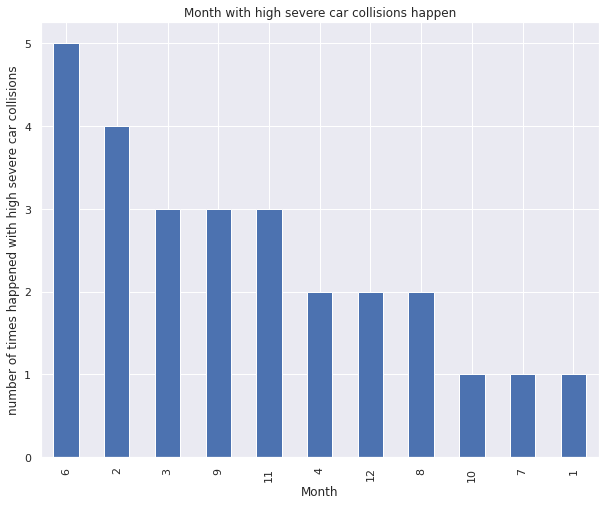

In [23]:
df_sortBySev=df.sort_values(by=['Severity'],ascending=False)
df_sortBySevTop=df_sortBySev.loc[df["Severity"]>6]
df_sortBySevTop
# we consider the car collision with severity 122 to be an invalid data, remove from df_sortBySevTop
df_sortBySevTop=df_sortBySevTop.loc[df["Severity"]<100]
df_SevInMonth=df_sortBySevTop["date_in_month"].value_counts()
df_SevInMonth.plot(kind='bar',figsize=(10,8))
plt.title('Month with high severe car collisions happen')
plt.xlabel('Month')
plt.ylabel('number of times happened with high severe car collisions')

From this barplot we can see that June havs highest number of times happened with high severe car collisions. This is reasonable because June is the beginning of summer, and people tend to start traveling to enjoy the nice summer.

Text(0, 0.5, 'number of times happened with high severe car collisions')

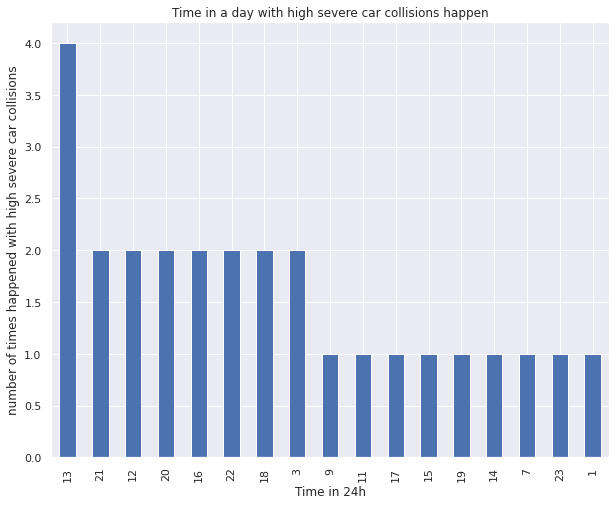

In [24]:
df_SevInHour=df_sortBySevTop["date_in_hour"].value_counts()
df_SevInHour.plot(kind='bar',figsize=(10,8))
plt.title('Time in a day with high severe car collisions happen')
plt.xlabel('Time in 24h')
plt.ylabel('number of times happened with high severe car collisions')

From this barplot, we can see that severe accidents peaked on 1pm and also peaked between 7pm-10pm.

Text(0, 0.5, 'number of times happened with high severe car collisions')

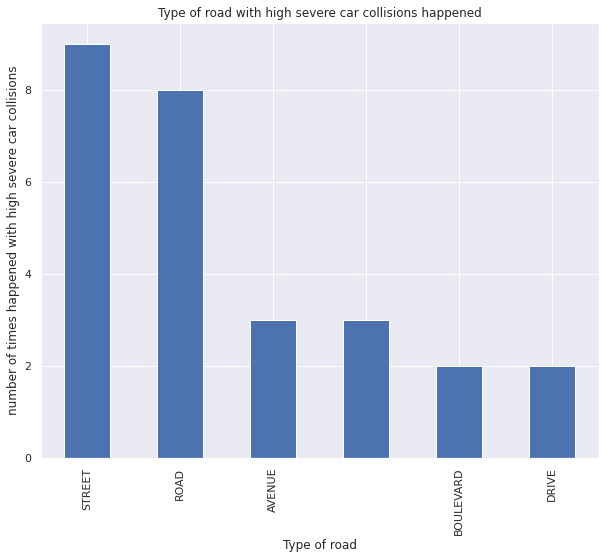

In [25]:
df_Add=df_sortBySevTop['address_sfx_primary'].value_counts()
df_Add.plot(kind='bar',figsize=(10,8))
plt.title('Type of road with high severe car collisions happened')
plt.xlabel('Type of road')
plt.ylabel('number of times happened with high severe car collisions')

From this barplot we can clearly see that Boulevard (Blvd) and Drive (Dr.) have less number of times in which severe car collisions happen. This is reasonable because according to the road naming convention, Boulevard (Blvd) is an extremely wide street, often with vegetation on either side and a median splitting up the lanes of traffic. Drive (Dr.)is a long, winding road with a route shaped by bodies of water, mountains, or other geography. Blvd and Dr. are wider than the Street and road, so less number of high severe car collisions happen in Blvd and Dr. (Reference:https://www.urbo.com/content/heres-the-difference-between-streets-boulevards-avenues-and-other-roads/)

# Analysis between severity and day, month, hour

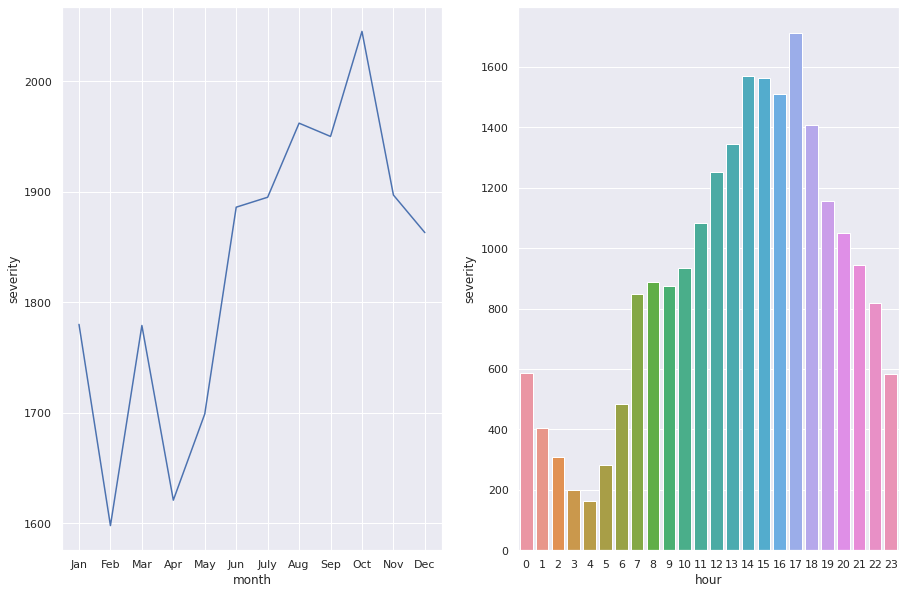

In [26]:
fig,axs = plt.subplots(nrows = 1,ncols =2, figsize =(15,10))
# anlysis severity in each month
month = 1
total_month = []
while(month <=12):
    total_month.append(df.loc[df['date_in_month'] == month, 'Severity'].sum())
    month= month + 1
m_data = {'month': ['Jan', 'Feb', 'Mar', 'Apr','May','Jun','July','Aug','Sep','Oct','Nov','Dec'], 'severity': total_month}
month_anlysis = pd.DataFrame(data=m_data)
sns.lineplot(x = 'month', y ='severity',data = month_anlysis,ax=axs[0],palette ='Reds')

# anlysis severity in each hour
total_hour = []
each_hour = []
hour = 0
while(hour <=23):
    total_hour.append(df.loc[df['date_in_hour']== hour,'Severity'].sum())
    each_hour.append(hour)
    hour = hour+1
h_data = {'hour': each_hour, 'severity': total_hour}
hour_anlysis = pd.DataFrame(data=h_data)
sns.barplot(x = 'hour', y ='severity',data = hour_anlysis,ax=axs[1])

Above we compare the serverity point with month and hour seperately. As we see from above visualization, Serverity point reaches to the maximum when it is 17:00. We suspect this is because 17:00 is most of people driving back to home from business or school.So this may cause traffic jam and therefore more likely to cause traffic collision and the damage traffic collision brings are the max at this time. In addition we can also see the severity are very low during 2am - 5am, since lots of people are sleeping during that time. In terms of month, the severity reachs to the max when it is october. November,December, and summer also have high severity. Since most of the holiday are concentrate at that time and summer is student's break. So we suspect that most of students and their family will travel which cause the severity point be higher.

[Text(0, 0, 'Friday'),
 Text(0, 0, 'Saturday'),
 Text(0, 0, 'Wednesday'),
 Text(0, 0, 'Thursday'),
 Text(0, 0, 'Sunday'),
 Text(0, 0, 'Tuesday'),
 Text(0, 0, 'Monday')]

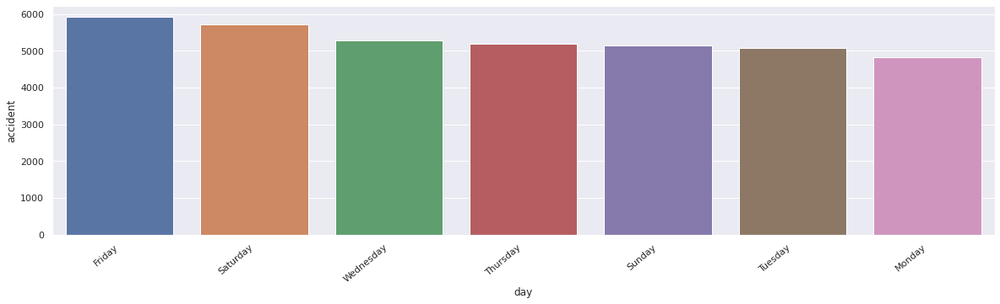

In [27]:
#anlysis severity in day
df["date_in_day"]=df["date_time"].str[:10]
day = []
for i in df['date_in_day']:
    temp = pd.Timestamp(i)
    name=temp.day_name()
    day.append(name)
some = pd.Index(day)
count=some.value_counts()
daytime=count.index.tolist()
number = count.values.tolist()
d_data = {'day': daytime, 'accident': number}
day_anlysis = pd.DataFrame(data=d_data)
day_plot=sns.barplot(x = 'day', y ='accident',data = day_anlysis)
day_plot.set_xticklabels(day_plot.get_xticklabels(), rotation=40, ha="right")


From the plot above we can see that Friday and Saturday are the two most day which accidents happen the most. We suspect it is because weekends and most people wants to hang out. and the reason which sunday are not that much may because most people choose to take break on Sunday after hanging out on Friday and Saturday in order to get ready for Monday.

#Violation and severity descriptives

First of all, we have to find the top 10 violation type first. The violation section variable is the violation type in the dataframe, but in the form of specific code.



In [28]:
df["violation_section"].value_counts().nlargest(10)

22107       8774
MISC-HAZ    7280
22350       4618
22106       2278
21453A      1882
20002(A)    1460
23152A      1172
21703       1148
21801A       774
21804        701
Name: violation_section, dtype: int64

We create a new dataframe with top ten violation type.

In [29]:
df['violation_section'].value_counts()[:10].index.tolist()
df_10 = df.loc[df['violation_section'].isin(['22107',
 'MISC-HAZ',
 '22350',
 '22106',
 '21453A',
 '21703',
 '20002(A)',
 '21801A',
 '23152A',
 '21804'])]
df_10

,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity,date_in_day
28684,2018-01-01 00:30:00,EL CAMINO DE TEATRO,,22350,VC,2018-01-01,1,0,0,2018-01-01
28685,2018-01-01 01:00:00,ROSECRANS,STREET,22350,VC,2018-01-01,1,1,0,2018-01-01
28688,2018-01-01 02:26:00,DIVISION,STREET,22107,VC,2018-01-01,1,2,0,2018-01-01
28689,2018-01-01 03:10:00,GESNER,STREET,22107,VC,2018-01-01,1,3,0,2018-01-01
28690,2018-01-01 03:13:00,CLAIREMONT,DRIVE,22107,VC,2018-01-01,1,3,3,2018-01-01
...,...,...,...,...,...,...,...,...,...,...
65821,2021-12-31 16:00:00,SIMS,ROAD,22106,VC,2021-12-31,12,16,1,2021-12-31
65823,2021-12-31 17:40:00,COLLEGE,AVENUE,MISC-HAZ,VC,2021-12-31,12,17,0,2021-12-31
65824,2021-12-31 18:00:00,SAN YSIDRO,BOULEVARD,20002(A),VC,2021-12-31,12,18,0,2021-12-31
65827,2021-12-31 20:23:18,HAWTHORN,STREET,22350,VC,2021-12-31,12,20,1,2021-12-31


We translate the code of violation section according to government document into its type name.

In [30]:
df_10['violation_section'].replace({'22107':"lane change",
 'MISC-HAZ':"Miscellaneous Driving Hazards",
 '22350':"highway speeding",
 '22106':"highway stop",
 '21453A':"redlight no stop",
 '21703':"Tailgaiting",
 '20002(A)':"misdemeanor hit and run",
 '21801A':"Not yielding when turning",
 '23152A':"drunk",
 '21804':"Improper Merge"},inplace=True)
df_10

,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity,date_in_day
28684,2018-01-01 00:30:00,EL CAMINO DE TEATRO,,highway speeding,VC,2018-01-01,1,0,0,2018-01-01
28685,2018-01-01 01:00:00,ROSECRANS,STREET,highway speeding,VC,2018-01-01,1,1,0,2018-01-01
28688,2018-01-01 02:26:00,DIVISION,STREET,lane change,VC,2018-01-01,1,2,0,2018-01-01
28689,2018-01-01 03:10:00,GESNER,STREET,lane change,VC,2018-01-01,1,3,0,2018-01-01
28690,2018-01-01 03:13:00,CLAIREMONT,DRIVE,lane change,VC,2018-01-01,1,3,3,2018-01-01
...,...,...,...,...,...,...,...,...,...,...
65821,2021-12-31 16:00:00,SIMS,ROAD,highway stop,VC,2021-12-31,12,16,1,2021-12-31
65823,2021-12-31 17:40:00,COLLEGE,AVENUE,Miscellaneous Driving Hazards,VC,2021-12-31,12,17,0,2021-12-31
65824,2021-12-31 18:00:00,SAN YSIDRO,BOULEVARD,misdemeanor hit and run,VC,2021-12-31,12,18,0,2021-12-31
65827,2021-12-31 20:23:18,HAWTHORN,STREET,highway speeding,VC,2021-12-31,12,20,1,2021-12-31


## **Display the most common violation type in San Diego**

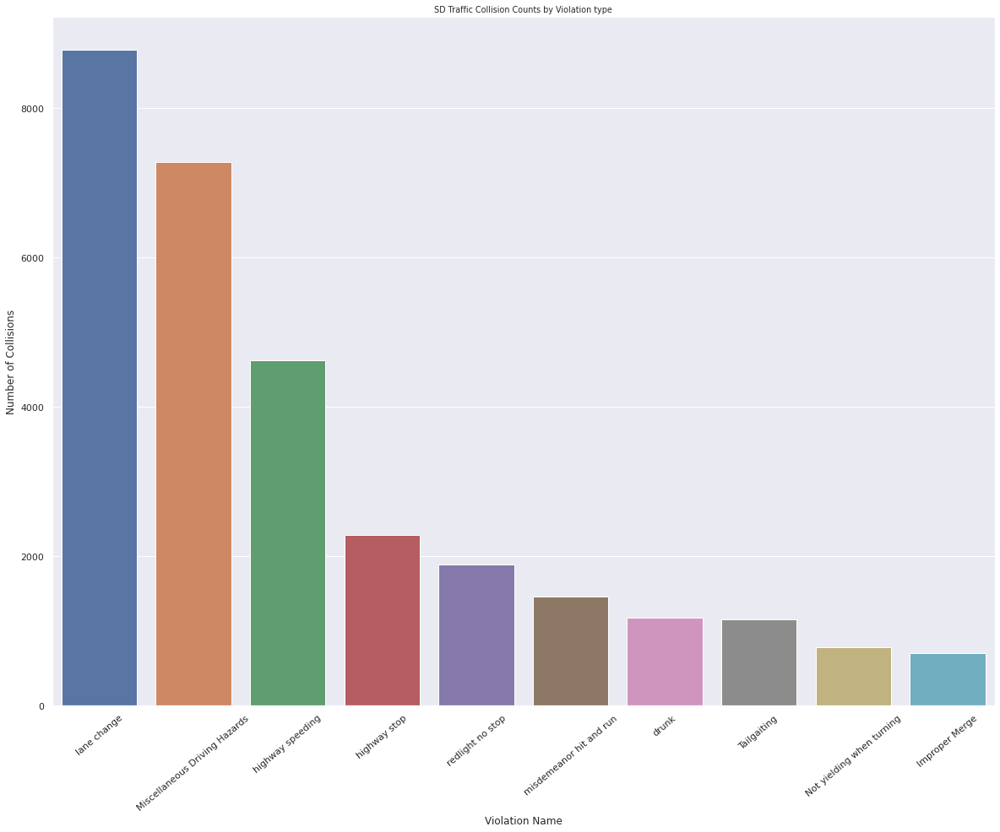

In [31]:
charge_type_df = pd.DataFrame(df_10['violation_section'].value_counts())
viosec_df = pd.DataFrame(df_10['violation_section'].value_counts())
viosec_df_top = charge_type_df 
plt.figure(figsize=(20,15))
ax1 = sns.barplot(data=viosec_df_top, x=viosec_df_top.index, y='violation_section')

sns.set_context("paper")
plt.title('SD Traffic Collision Counts by Violation type')
plt.xlabel('Violation Name')
plt.ylabel('Number of Collisions')
plt.xticks(rotation=40)
plt.show()


Here we can see the lane change, miscellaneous driving hazardas, and highway speeding are the most common violation type in San Diego. Also,We are interested in which kind of violation result in most serious severity

In [32]:
number_violations = df_10.violation_section.unique()
totalViolations = []

# Count each  violation
for violation in number_violations:
    Severity_vio_df = df_10[df_10.violation_section==violation]
    totalViolations.append((violation, sum(Severity_vio_df.Severity)))
    
# Sort and determine violations by Severity
top10_vio_sort_Severity = sorted(totalViolations, key=lambda tup: tup[1], reverse = True)
top10vio_Severity_df = pd.DataFrame(data=top10_vio_sort_Severity, columns = ['violation','Severity'])
top10vio_Severity_df

,violation,Severity
0,highway speeding,3833
1,lane change,3354
2,redlight no stop,2646
3,Miscellaneous Driving Hazards,1792
4,Not yielding when turning,1042
5,Tailgaiting,1039
6,Improper Merge,801
7,drunk,488
8,highway stop,455
9,misdemeanor hit and run,216


As we can see, highway speeding, lange change and redlight no stop cause most severity in traffic collision

## **Analyzing the correlation between weather and severity**

Since each day we may have not only one accident. Therefore, we need to sum up all the accident's severity on each day. So that we can perform anlysis on correlation between severity and average temperature, precipitation for each day.

In [33]:
# summing up the severity level by each date
total = df_copy.groupby(['date'])['Severity'].sum()
# create the new data set and input the date and severty level 
series_df =pd.DataFrame({'Date':total.index, 'severity':total.values})
# merge the two datasets on left join 
combine=pd.merge(weather_df,series_df, on=['Date'],how = 'left')
combine

,Date,Precipitation (mm),Avg Temp (C),severity
0,2015-01-01,0.0,10.00,0.0
1,2015-01-02,0.0,10.30,4.0
2,2015-01-03,0.0,11.95,NaN
3,2015-01-04,0.0,13.05,NaN
4,2015-01-05,0.0,16.65,NaN
...,...,...,...,...
1758,2019-10-25,0.0,23.90,24.0
1759,2019-10-26,0.0,20.80,14.0
1760,2019-10-27,0.0,18.35,16.0
1761,2019-10-28,0.0,18.35,16.0


We take a look at the dataset we merge, we find out there are null values in severity level. In order to do the linear anlysis, we choose to drop those null values.

In [34]:
combine = combine.dropna(how = 'any',subset = ['severity'])

# **Correlation between precipitation and severity**




**Null hypotheisis**: there is no significant relationship between precipitation and severity. 

**Significance level**: 0.05

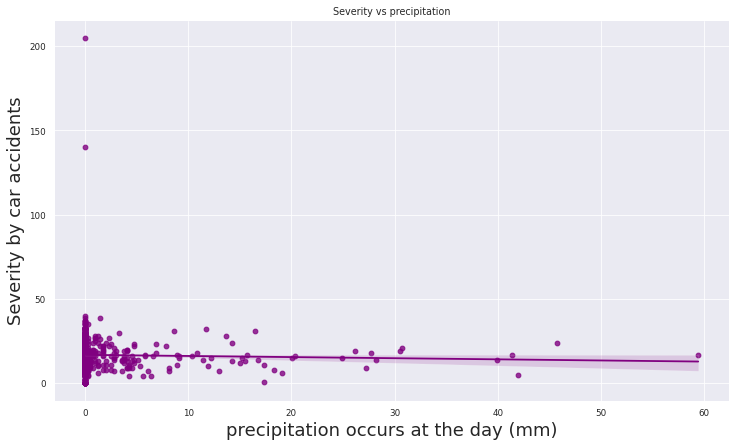

In [35]:
sns.lmplot(x = 'Precipitation (mm)',
           y = 'severity',
           data = combine, 
           fit_reg = True, 
           height = 6,
           aspect = 1.7, 
           line_kws={'color': 'purple'},
           scatter_kws={'color': 'purple'})
plt.ylabel('Severity by car accidents', size=18)
plt.xlabel('precipitation occurs at the day (mm)', size=18)
plt.title('Severity vs precipitation');

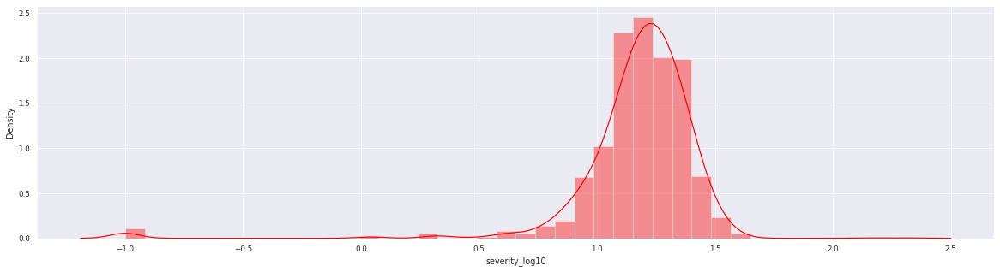

In [36]:
combine['severity_log10'] = np.log10(combine['severity'] + 0.1)
sns.distplot(combine['severity_log10'], 
             kde=True, bins=40, color="red")

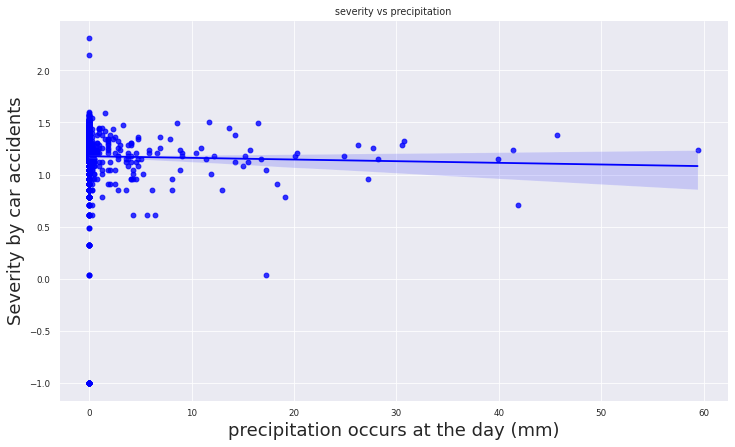

In [37]:
sns.lmplot(y = 'severity_log10',
           x = 'Precipitation (mm)',
           data = combine, 
           fit_reg = True, 
           height = 6,
           aspect = 1.7, 
           line_kws={'color': 'blue'},
           scatter_kws={'color': 'blue'})
plt.ylabel('Severity by car accidents', size=18)
plt.xlabel('precipitation occurs at the day (mm)', size=18)
plt.title('severity vs precipitation');

In [38]:
# Perform linear regression
severity_rain = combine[['Precipitation (mm)', 'severity_log10']]
severity_rain.columns = ['Precipitation', 'severity_log10']

outcome, predictors = patsy.dmatrices('severity_log10 ~ Precipitation', severity_rain)

# Use statsmodels to intialize an OLS linear model
mod_log = sm.OLS(outcome, predictors)
res_log = mod_log.fit()
print(res_log.summary())

                            OLS Regression Results                            
Dep. Variable:         severity_log10   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.7273
Date:                Tue, 07 Jun 2022   Prob (F-statistic):              0.394
Time:                        06:51:28   Log-Likelihood:                -232.43
No. Observations:                1693   AIC:                             468.9
Df Residuals:                    1691   BIC:                             479.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         1.1767      0.007    171.550

Here, we can't directly interpret our  𝛽1  estimate (coef) on our original scale above because we log-transformed our data. In order to interpet -0.0016 (what your  𝛽1  should be), we would say that for every one unit increase in the number of pulitzers a publication has, the viewership increases by ~(coef/100), which here would be (-0.0016/100)...or -0.000016. That effect is pretty small. This is further reflected in the p-value (0.394), which suggests that we would see these results, or something more extreme due to random chance alone approximately 3,94% of the time. Therefore, we reject the null hypothesis and conclude that there is significant relationship between variables.


# **Correlation between average temperature and severity**

**Null hypotheisis**: there is no significant relationship between average temperature and severity. 

**Significance level**: 0.05

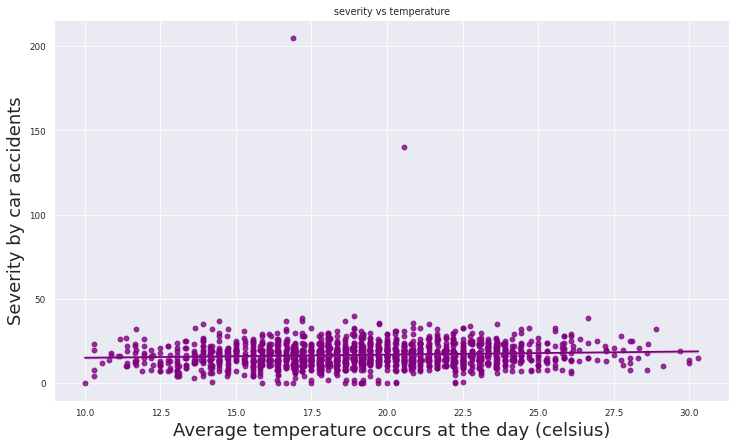

In [39]:
# perform linear regression method
sns.lmplot(x = 'Avg Temp (C)',
           y = 'severity',
           data = combine, 
           fit_reg = True, 
           height = 6,
           aspect = 1.7, 
           line_kws={'color': 'purple'},
           scatter_kws={'color': 'purple'})
plt.ylabel('Severity by car accidents', size=18)
plt.xlabel('Average temperature occurs at the day (celsius)', size=18)
plt.title('severity vs temperature');

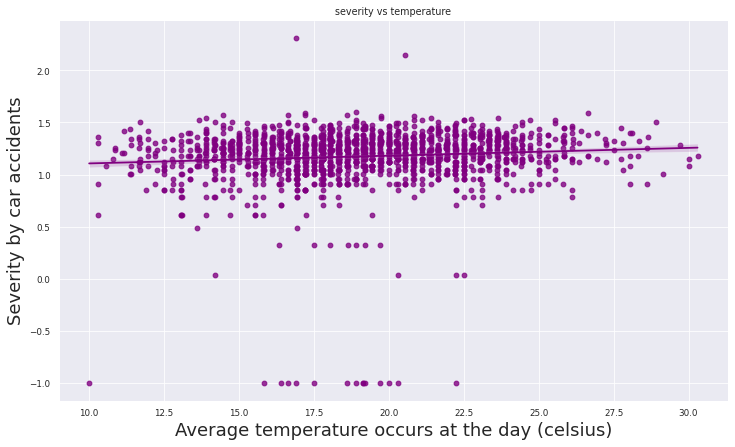

In [40]:
sns.lmplot(x = 'Avg Temp (C)',
           y = 'severity_log10',
           data = combine, 
           fit_reg = True, 
           height = 6,
           aspect = 1.7, 
           line_kws={'color': 'purple'},
           scatter_kws={'color': 'purple'})
plt.ylabel('Severity by car accidents', size=18)
plt.xlabel('Average temperature occurs at the day (celsius)', size=18)
plt.title('severity vs temperature');

In [41]:
# perform linear regression
severity_temp = combine[['Avg Temp (C)', 'severity_log10']]
severity_temp.columns = ['Avg_temp', 'severity_log10']

outcome, predictors = patsy.dmatrices('severity_log10 ~ Avg_temp', severity_temp)

#Use statsmodels to intialize an OLS linear model
mod_log = sm.OLS(outcome, predictors)
res_log = mod_log.fit()
print(res_log.summary())

                            OLS Regression Results                            
Dep. Variable:         severity_log10   R-squared:                       0.009
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     15.48
Date:                Tue, 07 Jun 2022   Prob (F-statistic):           8.67e-05
Time:                        06:51:31   Log-Likelihood:                -225.08
No. Observations:                1693   AIC:                             454.2
Df Residuals:                    1691   BIC:                             465.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0331      0.037     28.029      0.0

Here, we can't directly interpret our  𝛽1  estimate (coef) on our original scale above because we log-transformed our data. In order to interpet 0.0075 (what your  𝛽1  should be), we would say that for every one unit increase in the number of pulitzers a publication has, the viewership increases by ~(0.0075/100), which here would be 0.000075. That effect is pretty small. This is further reflected in the p-value, which is close to  0. It suggests that we would see these results, or something more extreme due to random chance alone approximately 0% of the time. Therefore, we reject the null hypothsis and conclude that there is significant relationship between variables.


# **Correlation between precipitation + average temperature and severity**

**Null hypotheisis**: there is no significant relationship between precipitation + average temperature and severity. 

**Significance level**: 0.05

In [42]:
combine['rain_temp'] = combine['Avg Temp (C)'] + combine['Precipitation (mm)']

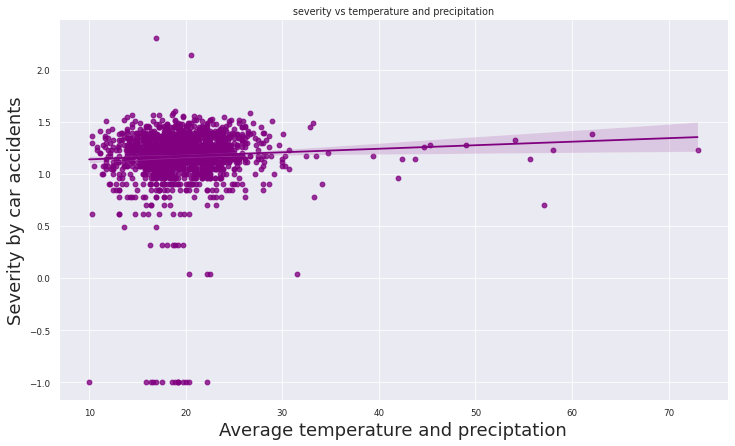

In [43]:
sns.lmplot(x = 'rain_temp',
           y = 'severity_log10',
           data = combine, 
           fit_reg = True, 
           height = 6,
           aspect = 1.7, 
           line_kws={'color': 'purple'},
           scatter_kws={'color': 'purple'})
plt.ylabel('Severity by car accidents', size=18)
plt.xlabel('Average temperature and preciptation', size=18)
plt.title('severity vs temperature and precipitation');

In [44]:
# Perform linear regression
severity_raintemp = combine[['rain_temp', 'severity_log10']]
severity_raintemp.columns = ['rain_temp', 'severity_log10']

outcome, predictors = patsy.dmatrices('severity_log10 ~ rain_temp', severity_raintemp)

# Use statsmodels to intialize an OLS linear model
mod_log = sm.OLS(outcome, predictors)
res_log = mod_log.fit()
print(res_log.summary())

                            OLS Regression Results                            
Dep. Variable:         severity_log10   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     5.454
Date:                Tue, 07 Jun 2022   Prob (F-statistic):             0.0196
Time:                        06:51:32   Log-Likelihood:                -230.07
No. Observations:                1693   AIC:                             464.1
Df Residuals:                    1691   BIC:                             475.0
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.1085      0.030     37.518      0.0

Here, we can't directly interpret our  𝛽1  estimate (coef) on our original scale above because we log-transformed our data. In order to interpet 8.83 (what your  𝛽1  should be), we would say that for every one unit increase in the number of pulitzers a publication has, the viewership increases by ~(0.0034/100), which here would be 0.000034. That effect is pretty small. This is further reflected in the p-value (0.02), which suggests that we would see these results, or something more extreme due to random chance alone approximately 2% of the time.Therefore, we reject the null hypothsis that there is significant relationship between the variables.


# predections


We're trying to observe if we could use the information in date_time to predict a severity of a collision

First, we need to get year and month from date_time and we did so by creating a new dataframe called dfPredict from df

In [45]:
import datetime
dfPredict = df
dfPredict['year'] = pd.DatetimeIndex(df['date_time']).year
dfPredict['month'] = pd.DatetimeIndex(df['date_time']).month
dfPredict

,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity,date_in_day,year,month
28684,2018-01-01 00:30:00,EL CAMINO DE TEATRO,,22350,VC,2018-01-01,1,0,0,2018-01-01,2018,1
28685,2018-01-01 01:00:00,ROSECRANS,STREET,22350,VC,2018-01-01,1,1,0,2018-01-01,2018,1
28686,2018-01-01 01:26:00,PALM,AVENUE,21954A,VC,2018-01-01,1,1,3,2018-01-01,2018,1
28687,2018-01-01 02:05:00,LOGAN,AVENUE,22450(A),VC,2018-01-01,1,2,0,2018-01-01,2018,1
28688,2018-01-01 02:26:00,DIVISION,STREET,22107,VC,2018-01-01,1,2,0,2018-01-01,2018,1
...,...,...,...,...,...,...,...,...,...,...,...,...
65824,2021-12-31 18:00:00,SAN YSIDRO,BOULEVARD,20002(A),VC,2021-12-31,12,18,0,2021-12-31,2021,12
65825,2021-12-31 19:35:00,OF CURBLINE 1900 CYPRESS,AVENUE,21750,VC,2021-12-31,12,19,1,2021-12-31,2021,12
65826,2021-12-31 20:15:52,35TH,STREET,21453B,VC,2021-12-31,12,20,0,2021-12-31,2021,12
65827,2021-12-31 20:23:18,HAWTHORN,STREET,22350,VC,2021-12-31,12,20,1,2021-12-31,2021,12


Then we converted the date_time to one hot encoding for easier analysis of categorical variables in the future

In [46]:
from sklearn.preprocessing import OneHotEncoder

### One hot encoding on years
encoder = OneHotEncoder(handle_unknown='ignore')
encoder_df = pd.DataFrame(encoder.fit_transform(dfPredict[['year']]).toarray())
adr = dfPredict.year.unique()
encoder_df.columns = adr
dfPredict = dfPredict.reset_index()
dfPredict = pd.concat([dfPredict, encoder_df], axis=1)

### One hot encoding on months
encoder = OneHotEncoder(handle_unknown='ignore')
encoder_df = pd.DataFrame(encoder.fit_transform(dfPredict[['month']]).toarray())
adr = dfPredict.month.unique()
encoder_df.columns = adr
dfPredict = pd.concat([dfPredict, encoder_df], axis=1)

dfPredict

,index,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity,...,3,4,5,6,7,8,9,10,11,12
0,28684,2018-01-01 00:30:00,EL CAMINO DE TEATRO,,22350,VC,2018-01-01,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28685,2018-01-01 01:00:00,ROSECRANS,STREET,22350,VC,2018-01-01,1,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28686,2018-01-01 01:26:00,PALM,AVENUE,21954A,VC,2018-01-01,1,1,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28687,2018-01-01 02:05:00,LOGAN,AVENUE,22450(A),VC,2018-01-01,1,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28688,2018-01-01 02:26:00,DIVISION,STREET,22107,VC,2018-01-01,1,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37139,65824,2021-12-31 18:00:00,SAN YSIDRO,BOULEVARD,20002(A),VC,2021-12-31,12,18,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37140,65825,2021-12-31 19:35:00,OF CURBLINE 1900 CYPRESS,AVENUE,21750,VC,2021-12-31,12,19,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37141,65826,2021-12-31 20:15:52,35TH,STREET,21453B,VC,2021-12-31,12,20,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37142,65827,2021-12-31 20:23:18,HAWTHORN,STREET,22350,VC,2021-12-31,12,20,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


We tried to split the data into training and testing sets and use machine learning method(logistic regression and Support Vector Machine) to train the model. 

In [47]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

X = np.array(dfPredict.iloc[:,-16:])
y = np.array(dfPredict['Severity'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)
LR = LogisticRegression().fit(X_train, y_train)
LR.score(X_test,y_test)

0.5604503181595692

In [48]:
from sklearn.svm import SVC
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
clf = SVC()
clf.fit(X_train, y_train)
LR = clf.fit(X_train, y_train)
LR.score(X_test,y_test)

0.5612661119269049

In [49]:
X = np.array(dfPredict[['month','year']])
y = np.array(dfPredict['Severity'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
LR2 = SVC().fit(X_train, y_train)
LR2.score(X_test,y_test)

0.5578397781040952

As we can see from the results, we got a relatively low score from out model, which means out model is not good at predicting severity from year and month. So we suspected that if there is actually a relationship between month and year to severity of the accident. So we carried out an Linear Regression.

In [50]:
outcome, predictors = patsy.dmatrices('Severity ~ month+year', dfPredict)
model = sm.OLS(outcome, predictors)
res_1 = model.fit()
print(res_1.summary())

                            OLS Regression Results                            
Dep. Variable:               Severity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     7.171
Date:                Tue, 07 Jun 2022   Prob (F-statistic):           0.000769
Time:                        06:53:44   Log-Likelihood:                -54332.
No. Observations:               37144   AIC:                         1.087e+05
Df Residuals:                   37141   BIC:                         1.087e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     27.7967      9.739      2.854      0.0

Now we tried to observed if we can predict the severity of a accident based on the type of violations of the accident using Suppor Vector Machine

In [51]:
dfPredict['violation_section'].replace({'22107':"lane change",
 'MISC-HAZ':"Miscellaneous Driving Hazards",
 '22350':"highway speeding",
 '22106':"highway stop",
 '21453A':"redlight no stop",
 '21703':"Tailgaiting",
 '20002(A)':"misdemeanor hit and run",
 '21801A':"Not yielding when turning",
 '23152A':"drunk",
 '21804':"Improper Merge"},inplace=True)
dfPredict

,index,date_time,address_road_primary,address_sfx_primary,violation_section,violation_type,date,date_in_month,date_in_hour,Severity,...,3,4,5,6,7,8,9,10,11,12
0,28684,2018-01-01 00:30:00,EL CAMINO DE TEATRO,,highway speeding,VC,2018-01-01,1,0,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,28685,2018-01-01 01:00:00,ROSECRANS,STREET,highway speeding,VC,2018-01-01,1,1,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,28686,2018-01-01 01:26:00,PALM,AVENUE,21954A,VC,2018-01-01,1,1,3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,28687,2018-01-01 02:05:00,LOGAN,AVENUE,22450(A),VC,2018-01-01,1,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,28688,2018-01-01 02:26:00,DIVISION,STREET,lane change,VC,2018-01-01,1,2,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37139,65824,2021-12-31 18:00:00,SAN YSIDRO,BOULEVARD,misdemeanor hit and run,VC,2021-12-31,12,18,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37140,65825,2021-12-31 19:35:00,OF CURBLINE 1900 CYPRESS,AVENUE,21750,VC,2021-12-31,12,19,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37141,65826,2021-12-31 20:15:52,35TH,STREET,21453B,VC,2021-12-31,12,20,0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37142,65827,2021-12-31 20:23:18,HAWTHORN,STREET,highway speeding,VC,2021-12-31,12,20,1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [52]:
### One hot encoding on months
encoder = OneHotEncoder(handle_unknown='ignore')
encoder_df = pd.DataFrame(encoder.fit_transform(dfPredict[['violation_section']]).toarray())
vs = dfPredict.violation_section.unique()
encoder_df.columns = vs
encoder_df

,highway speeding,21954A,22450(A),lane change,redlight no stop,Miscellaneous Driving Hazards,22101D,21650,23152(F),21453C,...,23152D,21655.8,21706,22500I,21717,38316,23105A,38304,2800.3,27801A
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37139,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
37140,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37141,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
37142,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [53]:
X = np.array(encoder_df)
y = np.array(dfPredict['Severity'])
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)
LR3 = SVC().fit(X_train, y_train)
LR3.score(X_test,y_test)

0.6776798825256976

As we can see, this time we got a decent score. Thus we could proceed to try to make predictions on severity using accident types(violation_section). We used classification report to see the accuracy of our predictions

In [54]:
from sklearn.metrics import classification_report, precision_recall_fscore_support
predicted = LR3.predict(X_train)
class_report_train = classification_report(y_train, predicted)
print(class_report_train)

              precision    recall  f1-score   support

           0       0.75      0.84      0.79     13918
           1       0.55      0.61      0.58      8381
           2       0.67      0.00      0.00      1812
           3       0.00      0.00      0.00       550
           4       0.00      0.00      0.00       152
           5       0.00      0.00      0.00        42
           6       0.00      0.00      0.00        12
           7       0.00      0.00      0.00         9
           8       0.00      0.00      0.00         3
           9       0.00      0.00      0.00         3
          10       0.00      0.00      0.00         1
          11       0.00      0.00      0.00         1
          12       0.00      0.00      0.00         1
         122       0.00      0.00      0.00         1

    accuracy                           0.67     24886
   macro avg       0.14      0.10      0.10     24886
weighted avg       0.65      0.67      0.64     24886



As we can see, our predictions are mostly accurate. Thus we can conclude it's plausible to use collision reasons(violation_selection) to predict the serverity of the collisions.

#Privacy/Ethics Considerations

- For data collection, all the traffic collision data we used are trustworthy dataset recorded by the San Diego Police Departments and are publicly available in the San Diego governmental database. Since all personal and private information such as gender and age are already excluded from the data, there shouldn’t be any forms of privacy violation within this study, and there is no need to secure and protect the data. 


- Furthermore, our primary focus is to analyze the specific location and time period for collisions based on severity which are not associated with all kinds of personal characteristics’ information, and the time and location are objective statistics that are collected based on strict and uniform standards. Therefore, we believe that our pure data are free from any biases during data collection. One potential bias of the data that we collected is the lack of collision information for some places in the city due to various circumstances. To address this problem, we will specify the location range that our data covered to avoid any misleading conclusions. We will also exclude any null data after careful inspections. Finally, during data analysis, we will make sure to include as much data as possible from all locations in the San Diego city to ensure that our data are representative of the whole. All of our visualization, summary statistics are honest representations of the data we collected, and we have included a detailed explanation of each step we take to make those conclusions clear and convincing.

#Conclusion & Discussion

- By sorting all streets based on the total number of collisions between 2018 to 2021, and creating a map visualization of all collisions, we have found the most dangerous streets in San Diego: University Avenue and El Cajon Boulevard, which confirms our hypothesis since both streets are very large streets with a lot of intersections. By researching online, we have found several news reports mentioning the safety issues of these two streets such as the lack of pedestrian lanes and traffic lights. The result of our data provides strong evidence of inadequate design of these two streets, and some action needs to be taken by the San Diego city government to improve the safety of those streets.
- We also analyze the collision patterns varies by time, since the intensity of each traffic collision are different, we also take into consideration the severity by assigning a specific number to each collision.Thus, our result shows that 17:00 in the evening is the most dangerous time of the day, and Friday and Saturday are the day of the week. There is no noticeable difference between moths and years. The only exception is March to June in 2020. Since most people stay at home at that time due to the pandemic, the collision rate is very low. Overall, people living in San Diego should be very careful when driving a car after leaving work especially Friday night or driving out to play on Saturday. In terms of severity, we also found out that the top 3 violations’ type associated with high severity are high speed driving, lane changing, and not stopping at red light.
- For the relationship between weather and severity, we look at the effect of precipitation, temperature, and both on the severity of collisions. For precipitation, since p value is greater than 0.05, we fail to reject the null hypothesis and there does not exist a significant relationship. For temperature and both, there exist significant relationships, but both coefficients are close to 0, so the relationships may be due to confounding variables. 
- In the end, we also try to predict the amount and severity of collision using time, and collision types, due to the existence of potential confounding variables and traffic collisions are caused by many factors directly or indirectly, we do not have a very accurate prediction of vehicle accidents and severity, but we hope that what we have found will help people who live in this area to understand the traffic regulations so they can make a better decision when they are drive within San Diego. 


# Limitation

We also have limitation in our analysis. In our analysis with severity, we take injured number as well as killed number to calculate the severity. However, this does not take how severe a injury is into account. It's hard to quantify severity as well as its effect to our other factors.
Also for our weather datasets, we only have data till 2019. Which means we can't anlysis the most recent day. For our longitude and latitude it only cover 2017-2019. Again we can't see the collision happened after 2019 on the map. On the anlysis between weather and severity. When we take a look at the coefficient, It is very small. Although we got the result of there is significant difference between temperature vs severity, temperature + precipitation vs severity, because of the coefficent is small, it seems the the correlation is not that strong. It may tells us there exists some potential confounding variable which affect the results. The example may be road condition etc.

#Team Contribution

All of the members in our team contributed equally to topic choosing, result analysis and final video making.

Yuxuan Chen:
1. Anlysis severity and day,month,year
2.data visulization(word cloud, folium map)
3.Anlysis correlation between weather and severity


  Jingtian Ma
  1. Overview, backgroud, and reaserch question.
  2. Violation type descriptives and data visualizations.
  3. Bug checks % fixes and  comments

Jiayang Bao
1. Data cleaning and processing
2. Analysis and visualization for severtiy and road type
3. Description of analysis.

Xinyi(Cindy) Wang
1. Privacy/Ethics Considerations
2. Conclusion & Discussion
3. Analyze Collisions by Geography

Tianze Zhang
1. use machine learning algorithms for predictions
2. analyze the factors that could be potentially used to predict severity
3. testing accuracy of predictions

Project Video: https://youtu.be/1IP7GTZsPWc